In [73]:
import numpy as np
import pandas as pd
import seaborn as sns
import missingno as msno
sns.set(style='darkgrid')
import matplotlib.pyplot as plt

In [74]:
from google.colab import drive
drive.mount('/content/drive')

Drive already mounted at /content/drive; to attempt to forcibly remount, call drive.mount("/content/drive", force_remount=True).


In [75]:
# Loading the dataset
# Loading the dataset
data1 = pd.read_csv('/content/drive/MyDrive/data/Monday-WorkingHours.pcap_ISCX.csv')
data2 = pd.read_csv('/content/drive/MyDrive/data/Tuesday-WorkingHours.pcap_ISCX.csv')
data3 = pd.read_csv('/content/drive/MyDrive/data/Wednesday-workingHours.pcap_ISCX.csv')
data4 = pd.read_csv('/content/drive/MyDrive/data/Thursday-WorkingHours-Morning-WebAttacks.pcap_ISCX.csv')
data5 = pd.read_csv('/content/drive/MyDrive/data/Thursday-WorkingHours-Afternoon-Infilteration.pcap_ISCX.csv')
data6 = pd.read_csv('/content/drive/MyDrive/data/Friday-WorkingHours-Morning.pcap_ISCX.csv')
data7 = pd.read_csv('/content/drive/MyDrive/data/Friday-WorkingHours-Afternoon-PortScan.pcap_ISCX.csv')
data8 = pd.read_csv('/content/drive/MyDrive/data/Friday-WorkingHours-Afternoon-DDos.pcap_ISCX.csv')
data9 = pd.read_csv('/content/drive/MyDrive/data/PortScanning.csv')
data10 = pd.read_csv('/content/drive/MyDrive/data/WebAttack.csv')
data11 = pd.read_csv('/content/drive/MyDrive/data/Normal_Behavior.csv')
data12 = pd.read_csv('/content/drive/MyDrive/data/Normal-Traffic.csv')
data13 = pd.read_csv('/content/drive/MyDrive/data/Brute-Force.csv')
data14 = pd.read_csv('/content/drive/MyDrive/data/PortScan.csv')

In [76]:
data_list1 = [data1, data2, data3, data4, data5, data6, data7, data8]
data_list2 = [data9, data10,data11,data12,data13,data14]
print('Data dimensions: ')
for i, data in enumerate(data_list1, start = 1):
  rows, cols = data.shape
  print(f'Data{i} -> {rows} rows, {cols} columns')
for i, data in enumerate(data_list2, start = 9):
  rows, cols = data.shape
  print(f'Data{i} -> {rows} rows, {cols} columns')

Data dimensions: 
Data1 -> 529918 rows, 79 columns
Data2 -> 445909 rows, 79 columns
Data3 -> 692703 rows, 79 columns
Data4 -> 170366 rows, 79 columns
Data5 -> 288602 rows, 79 columns
Data6 -> 191033 rows, 79 columns
Data7 -> 286467 rows, 79 columns
Data8 -> 225745 rows, 79 columns
Data9 -> 16652 rows, 78 columns
Data10 -> 29232 rows, 78 columns
Data11 -> 2260 rows, 78 columns
Data12 -> 1208 rows, 78 columns
Data13 -> 275 rows, 78 columns
Data14 -> 2103 rows, 78 columns


In [77]:
data_1 = pd.concat(data_list1)
data_2 = pd.concat(data_list2)
rows1, cols1 = data_1.shape
rows2, cols2 = data_2.shape

print('New dimension set1:')
print(f'Number of rows: {rows1}')
print(f'Number of columns: {cols1}')
print(f'Total cells: {rows1 * cols1}')
print('New dimension set2:')
print(f'Number of rows: {rows2}')
print(f'Number of columns: {cols2}')
print(f'Total cells: {rows2 * cols2}')

New dimension set1:
Number of rows: 2830743
Number of columns: 79
Total cells: 223628697
New dimension set2:
Number of rows: 51730
Number of columns: 78
Total cells: 4034940


In [78]:
data_1[' Label'].value_counts()

,count
Label,
BENIGN,2273097
DoS Hulk,231073
PortScan,158930
DDoS,128027
DoS GoldenEye,10293
FTP-Patator,7938
SSH-Patator,5897
DoS slowloris,5796
DoS Slowhttptest,5499


In [79]:
# Creating a dictionary that maps each label to its attack type
attack_map = {
    'BENIGN': 'BENIGN',
    'DDoS': 'DDoS',
    'DoS Hulk': 'DoS',
    'DoS GoldenEye': 'DoS',
    'DoS slowloris': 'DoS',
    'DoS Slowhttptest': 'DoS',
    'PortScan': 'Port Scan',
    'FTP-Patator': 'Brute Force',
    'SSH-Patator': 'Brute Force',
    'Bot': 'Bot',
    'Web Attack � Brute Force': 'Web Attack',
    'Web Attack � XSS': 'Web Attack',
    'Web Attack � Sql Injection': 'Web Attack',
    'Infiltration': 'Infiltration',
    'Heartbleed': 'Heartbleed'
}

# Creating a new column 'Attack Type' in the DataFrame based on the attack_map dictionary
data_1['Attack Type'] = data_1[' Label'].map(attack_map)
data_2['Attack Type'] = data_2[' Label']

In [80]:
data_1['Attack Type'].value_counts()


,count
Attack Type,
BENIGN,2273097
DoS,252661
Port Scan,158930
DDoS,128027
Brute Force,13835
Web Attack,2180
Bot,1966
Infiltration,36
Heartbleed,11


In [81]:
data_2['Attack Type'].value_counts()

,count
Attack Type,
Web Attack,29232
Port Scan,18755
BENIGN,3468
Brute Force,275


In [82]:
data_1.drop(' Label', axis=1, inplace=True)
data_2.drop(' Label', axis=1, inplace=True)

In [83]:
pd.options.display.max_columns = 80
data_1

,Destination Port,Flow Duration,Total Fwd Packets,Total Backward Packets,Total Length of Fwd Packets,Total Length of Bwd Packets,Fwd Packet Length Max,Fwd Packet Length Min,Fwd Packet Length Mean,Fwd Packet Length Std,Bwd Packet Length Max,Bwd Packet Length Min,Bwd Packet Length Mean,Bwd Packet Length Std,Flow Bytes/s,Flow Packets/s,Flow IAT Mean,Flow IAT Std,Flow IAT Max,Flow IAT Min,Fwd IAT Total,Fwd IAT Mean,Fwd IAT Std,Fwd IAT Max,Fwd IAT Min,Bwd IAT Total,Bwd IAT Mean,Bwd IAT Std,Bwd IAT Max,Bwd IAT Min,Fwd PSH Flags,Bwd PSH Flags,Fwd URG Flags,Bwd URG Flags,Fwd Header Length,Bwd Header Length,Fwd Packets/s,Bwd Packets/s,Min Packet Length,Max Packet Length,Packet Length Mean,Packet Length Std,Packet Length Variance,FIN Flag Count,SYN Flag Count,RST Flag Count,PSH Flag Count,ACK Flag Count,URG Flag Count,CWE Flag Count,ECE Flag Count,Down/Up Ratio,Average Packet Size,Avg Fwd Segment Size,Avg Bwd Segment Size,Fwd Header Length.1,Fwd Avg Bytes/Bulk,Fwd Avg Packets/Bulk,Fwd Avg Bulk Rate,Bwd Avg Bytes/Bulk,Bwd Avg Packets/Bulk,Bwd Avg Bulk Rate,Subflow Fwd Packets,Subflow Fwd Bytes,Subflow Bwd Packets,Subflow Bwd Bytes,Init_Win_bytes_forward,Init_Win_bytes_backward,act_data_pkt_fwd,min_seg_size_forward,Active Mean,Active Std,Active Max,Active Min,Idle Mean,Idle Std,Idle Max,Idle Min,Attack Type
0,49188,4,2,0,12,0,6,6,6.0,0.0,0,0,0.0,0.0,3.000000e+06,5.000000e+05,4.0,0.0,4,4,4,4.0,0.0,4,4,0,0.0,0.0,0,0,0,0,0,0,40,0,5.000000e+05,0.00000,6,6,6.0,0.0,0.0,0,0,0,0,1,1,0,0,0,9.0,6.0,0.0,40,0,0,0,0,0,0,2,12,0,0,329,-1,1,20,0.0,0.0,0,0,0.0,0.0,0,0,BENIGN
1,49188,1,2,0,12,0,6,6,6.0,0.0,0,0,0.0,0.0,1.200000e+07,2.000000e+06,1.0,0.0,1,1,1,1.0,0.0,1,1,0,0.0,0.0,0,0,0,0,0,0,40,0,2.000000e+06,0.00000,6,6,6.0,0.0,0.0,0,0,0,0,1,1,0,0,0,9.0,6.0,0.0,40,0,0,0,0,0,0,2,12,0,0,329,-1,1,20,0.0,0.0,0,0,0.0,0.0,0,0,BENIGN
2,49188,1,2,0,12,0,6,6,6.0,0.0,0,0,0.0,0.0,1.200000e+07,2.000000e+06,1.0,0.0,1,1,1,1.0,0.0,1,1,0,0.0,0.0,0,0,0,0,0,0,40,0,2.000000e+06,0.00000,6,6,6.0,0.0,0.0,0,0,0,0,1,1,0,0,0,9.0,6.0,0.0,40,0,0,0,0,0,0,2,12,0,0,329,-1,1,20,0.0,0.0,0,0,0.0,0.0,0,0,BENIGN
3,49188,1,2,0,12,0,6,6,6.0,0.0,0,0,0.0,0.0,1.200000e+07,2.000000e+06,1.0,0.0,1,1,1,1.0,0.0,1,1,0,0.0,0.0,0,0,0,0,0,0,40,0,2.000000e+06,0.00000,6,6,6.0,0.0,0.0,0,0,0,0,1,1,0,0,0,9.0,6.0,0.0,40,0,0,0,0,0,0,2,12,0,0,329,-1,1,20,0.0,0.0,0,0,0.0,0.0,0,0,BENIGN
4,49486,3,2,0,12,0,6,6,6.0,0.0,0,0,0.0,0.0,4.000000e+06,6.666667e+05,3.0,0.0,3,3,3,3.0,0.0,3,3,0,0.0,0.0,0,0,0,0,0,0,40,0,6.666667e+05,0.00000,6,6,6.0,0.0,0.0,0,0,0,0,1,1,0,0,0,9.0,6.0,0.0,40,0,0,0,0,0,0,2,12,0,0,245,-1,1,20,0.0,0.0,0,0,0.0,0.0,0,0,BENIGN
...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...
225740,61374,61,1,1,6,6,6,6,6.0,0.0,6,6,6.0,0.0,1.967213e+05,3.278689e+04,61.0,0.0,61,61,0,0.0,0.0,0,0,0,0.0,0.0,0,0,0,0,0,0,20,20,1.639344e+04,16393.44262,6,6,6.0,0.0,0.0,0,0,0,0,1,1,0,0,1,9.0,6.0,6.0,20,0,0,0,0,0,0,1,6,1,6,288,253,0,20,0.0,0.0,0,0,0.0,0.0,0,0,BENIGN
225741,61378,72,1,1,6,6,6,6,6.0,0.0,6,6,6.0,0.0,1.666667e+05,2.777778e+04,72.0,0.0,72,72,0,0.0,0.0,0,0,0,0.0,0.0,0,0,0,0,0,0,20,20,1.388889e+04,13888.88889,6,6,6.0,0.0,0.0,0,0,0,0,1,1,0,0,1,9.0,6.0,6.0,20,0,0,0,0,0,0,1,6,1,6,288,253,0,20,0.0,0.0,0,0,0.0,0.0,0,0,BENIGN
225742,61375,75,1,1,6,6,6,6,6.0,0.0,6,6,6.0,0.0,1.600000e+05,2.666667e+04,75.0,0.0,75,75,0,0.0,0.0,0,0,0,0.0,0.0,0,0,0,0,0,0,20,20,1.333333e+04,13333.33333,6,6,6.0,0.0,0.0,0,0,0,0,1,1,0,0,1,9.0,6.0,6.0,20,0,0,0,0,0,0,1,6,1,6,288,253,0,20,0.0,0.0,0,0,0.0,0.0,0,0,BENIGN
225743,61323,48,2,0,12,0,6,6,6.0,0.0,0,0,0.0,0.0,2.500000e+05,4.166667e+04,48.0,0.0,48,48,48,48.0,0.0,48,48,0,0.0,0.0,0,0,0,0,0,0,40,0,4.166667e+04,0.00000,6,6,6.0,0.0,0.0,0,0,0,0,1,0,0,0,0,9.0,6.0,0.0,40,0,0,0,0,0,0,2,12,0,0,4719,-1,1,20,0.0,0.0,0,0,0.0,0.0,0,0,BENIGN


In [84]:
pd.options.display.max_columns = 80
data_2

,Destination Port,Flow Duration,Total Fwd Packets,Total Backward Packets,Total Length of Fwd Packets,Total Length of Bwd Packets,Fwd Packet Length Max,Fwd Packet Length Min,Fwd Packet Length Mean,Fwd Packet Length Std,Bwd Packet Length Max,Bwd Packet Length Min,Bwd Packet Length Mean,Bwd Packet Length Std,Flow Bytes/s,Flow Packets/s,Flow IAT Mean,Flow IAT Std,Flow IAT Max,Flow IAT Min,Fwd IAT Total,Fwd IAT Mean,Fwd IAT Std,Fwd IAT Max,Fwd IAT Min,Bwd IAT Total,Bwd IAT Mean,Bwd IAT Std,Bwd IAT Max,Bwd IAT Min,Fwd PSH Flags,Bwd PSH Flags,Fwd URG Flags,Bwd URG Flags,Fwd Header Length,Bwd Header Length,Fwd Packets/s,Bwd Packets/s,Min Packet Length,Max Packet Length,Packet Length Mean,Packet Length Std,Packet Length Variance,FIN Flag Count,SYN Flag Count,RST Flag Count,PSH Flag Count,ACK Flag Count,URG Flag Count,CWE Flag Count,ECE Flag Count,Down/Up Ratio,Average Packet Size,Avg Fwd Segment Size,Avg Bwd Segment Size,Fwd Avg Bytes/Bulk,Fwd Avg Packets/Bulk,Fwd Avg Bulk Rate,Bwd Avg Bytes/Bulk,Bwd Avg Packets/Bulk,Bwd Avg Bulk Rate,Subflow Fwd Packets,Subflow Fwd Bytes,Subflow Bwd Packets,Subflow Bwd Bytes,Init_Win_bytes_forward,Init_Win_bytes_backward,act_data_pkt_fwd,min_seg_size_forward,Active Mean,Active Std,Active Max,Active Min,Idle Mean,Idle Std,Idle Max,Idle Min,Attack Type
0,1088,64608,0,2,0.0,100.0,0.0,0.0,0.0,0.0,100.0,0.0,50.0,70.710678,1547.795939,30.955919,64608.0,0.000000e+00,64608.0,64608.0,0.0,0.00,0.000000e+00,0.0,0.0,64608.0,64608.0,0.0,64608.0,64608.0,0,0,0,0,0,44,0.000000,30.955919,0.0,100.0,66.666667,57.735027,3333.333333,0,1,0,0,0,0,0,0,0.0,100.0,0.0,50.0,0,0,0,0,0,0,0,0,2,100,-1,0,0,0,0.0,0.0,0.0,0.0,0.0,0.000000e+00,0.0,0.0,Port Scan
1,19315,69399,0,2,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.000000,0.000000,28.818859,69399.0,0.000000e+00,69399.0,69399.0,0.0,0.00,0.000000e+00,0.0,0.0,69399.0,69399.0,0.0,69399.0,69399.0,0,0,0,0,0,44,0.000000,28.818859,0.0,0.0,0.000000,0.000000,0.000000,0,1,0,0,0,0,0,0,0.0,0.0,0.0,0.0,0,0,0,0,0,0,0,0,2,0,-1,0,0,0,0.0,0.0,0.0,0.0,0.0,0.000000e+00,0.0,0.0,Port Scan
2,7741,64778,0,2,0.0,100.0,0.0,0.0,0.0,0.0,100.0,0.0,50.0,70.710678,1543.733984,30.874680,64778.0,0.000000e+00,64778.0,64778.0,0.0,0.00,0.000000e+00,0.0,0.0,64778.0,64778.0,0.0,64778.0,64778.0,0,0,0,0,0,44,0.000000,30.874680,0.0,100.0,66.666667,57.735027,3333.333333,0,1,0,0,0,0,0,0,0.0,100.0,0.0,50.0,0,0,0,0,0,0,0,0,2,100,-1,0,0,0,0.0,0.0,0.0,0.0,0.0,0.000000e+00,0.0,0.0,Port Scan
3,3370,60149,0,2,0.0,100.0,0.0,0.0,0.0,0.0,100.0,0.0,50.0,70.710678,1662.538031,33.250761,60149.0,0.000000e+00,60149.0,60149.0,0.0,0.00,0.000000e+00,0.0,0.0,60149.0,60149.0,0.0,60149.0,60149.0,0,0,0,0,0,44,0.000000,33.250761,0.0,100.0,66.666667,57.735027,3333.333333,0,1,0,0,0,0,0,0,0.0,100.0,0.0,50.0,0,0,0,0,0,0,0,0,2,100,-1,0,0,0,0.0,0.0,0.0,0.0,0.0,0.000000e+00,0.0,0.0,Port Scan
4,720,64932,0,2,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.000000,0.000000,30.801454,64932.0,0.000000e+00,64932.0,64932.0,0.0,0.00,0.000000e+00,0.0,0.0,64932.0,64932.0,0.0,64932.0,64932.0,0,0,0,0,0,44,0.000000,30.801454,0.0,0.0,0.000000,0.000000,0.000000,0,1,0,0,0,0,0,0,0.0,0.0,0.0,0.0,0,0,0,0,0,0,0,0,2,0,-1,0,0,0,0.0,0.0,0.0,0.0,0.0,0.000000e+00,0.0,0.0,Port Scan
...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...
2098,9595,10,0,2,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.000000,0.000000,200000.000000,10.0,0.000000e+00,10.0,10.0,0.0,0.00,0.000000e+00,0.0,0.0,10.0,10.0,0.0,10.0,10.0,0,0,0,0,0,44,0.000000,200000.000000,0.0,0.0,0.000000,0.000000,0.000000,0,1,0,0,0,0,0,0,0.0,0.0,0.0,0.0,0,0,0,0,0,0,0,0,2,0,-1,0,0,0,0.0,0.0,0.0,0.0,0.0,0.000000e+00,0.0,0.0,Port Scan
2099,2030,3,0,2,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.000000,0.000000,666666.666667,3.0,0.000000e+00,3.0,3.0,0.0,0.00,0.000000e+00,0.0,0.0,3.0,3.0,0.0,3.0,3.0,

In [85]:
data_1 = data_1.drop(columns=[' Fwd Header Length.1'])

In [86]:
target_label_list = ["DoS", "DDoS", "Brute Force", "Port Scan", "BENIGN", "Web Attack"]
target_samples_list = [47200, 45200, 13835, 40000, 40940, 2180]
label_column = "Attack Type"

sampled_dfs = []  # to collect all sampled subsets

for label, sample in zip(target_label_list, target_samples_list):
    sampled_df1 = data_1[data_1[label_column] == label].sample(n=sample, random_state=42)
    sampled_dfs.append(sampled_df1)

# Combine all sampled subsets into a single DataFrame
final_sampled_df1 = pd.concat(sampled_dfs, ignore_index=True)

In [87]:
final_sampled_df1['Attack Type'].value_counts()

,count
Attack Type,
DoS,47200
DDoS,45200
BENIGN,40940
Port Scan,40000
Brute Force,13835
Web Attack,2180


In [88]:
final_sampled_df2 = data_2

In [89]:
final_sampled_df2['Attack Type'].value_counts()

,count
Attack Type,
Web Attack,29232
Port Scan,18755
BENIGN,3468
Brute Force,275


In [90]:
data_list=[final_sampled_df1,final_sampled_df2]
data = pd.concat(data_list)
rows, cols = data.shape

print('New dimension:')
print(f'Number of rows: {rows}')
print(f'Number of columns: {cols}')
print(f'Total cells: {rows * cols}')

New dimension:
Number of rows: 241085
Number of columns: 78
Total cells: 18804630


In [91]:
import gc
for d in data_list1: del d
for d in data_list2: del d
del final_sampled_df1 ,final_sampled_df2 ,data_1,data_2
gc.collect()

174891

In [92]:
# Renaming the columns by removing leading/trailing whitespace
col_names = {col: col.strip() for col in data.columns}
data.rename(columns = col_names, inplace = True)

In [93]:
data.columns

Index(['Destination Port', 'Flow Duration', 'Total Fwd Packets',
       'Total Backward Packets', 'Total Length of Fwd Packets',
       'Total Length of Bwd Packets', 'Fwd Packet Length Max',
       'Fwd Packet Length Min', 'Fwd Packet Length Mean',
       'Fwd Packet Length Std', 'Bwd Packet Length Max',
       'Bwd Packet Length Min', 'Bwd Packet Length Mean',
       'Bwd Packet Length Std', 'Flow Bytes/s', 'Flow Packets/s',
       'Flow IAT Mean', 'Flow IAT Std', 'Flow IAT Max', 'Flow IAT Min',
       'Fwd IAT Total', 'Fwd IAT Mean', 'Fwd IAT Std', 'Fwd IAT Max',
       'Fwd IAT Min', 'Bwd IAT Total', 'Bwd IAT Mean', 'Bwd IAT Std',
       'Bwd IAT Max', 'Bwd IAT Min', 'Fwd PSH Flags', 'Bwd PSH Flags',
       'Fwd URG Flags', 'Bwd URG Flags', 'Fwd Header Length',
       'Bwd Header Length', 'Fwd Packets/s', 'Bwd Packets/s',
       'Min Packet Length', 'Max Packet Length', 'Packet Length Mean',
       'Packet Length Std', 'Packet Length Variance', 'FIN Flag Count',
       'SYN Flag Co

In [94]:
data.info()

<class 'pandas.core.frame.DataFrame'>
Index: 241085 entries, 0 to 2102
Data columns (total 78 columns):
 #   Column                       Non-Null Count   Dtype  
---  ------                       --------------   -----  
 0   Destination Port             241085 non-null  int64  
 1   Flow Duration                241085 non-null  int64  
 2   Total Fwd Packets            241085 non-null  int64  
 3   Total Backward Packets       241085 non-null  int64  
 4   Total Length of Fwd Packets  241085 non-null  float64
 5   Total Length of Bwd Packets  241085 non-null  float64
 6   Fwd Packet Length Max        241085 non-null  float64
 7   Fwd Packet Length Min        241085 non-null  float64
 8   Fwd Packet Length Mean       241085 non-null  float64
 9   Fwd Packet Length Std        241085 non-null  float64
 10  Bwd Packet Length Max        241085 non-null  float64
 11  Bwd Packet Length Min        241085 non-null  float64
 12  Bwd Packet Length Mean       241085 non-null  float64
 13  Bwd Pa

In [95]:
pd.options.display.max_rows = 80

print('Overview of Columns:')
data.describe().transpose()

Overview of Columns:


,count,mean,std,min,25%,50%,75%,max
Destination Port,241085.0,4.917642e+03,1.174266e+04,0.0,80.000000,80.000000,5.910000e+03,6.552700e+04
Flow Duration,241085.0,1.737150e+07,3.477696e+07,-1.0,88.000000,57323.000000,8.008809e+06,1.200000e+08
Total Fwd Packets,241085.0,4.330054e+00,6.360179e+01,0.0,1.000000,2.000000,5.000000e+00,1.595700e+04
Total Backward Packets,241085.0,4.295721e+00,4.991486e+01,0.0,1.000000,2.000000,5.000000e+00,1.284400e+04
Total Length of Fwd Packets,241085.0,2.687490e+02,1.219794e+04,0.0,0.000000,14.000000,7.400000e+01,5.828706e+06
Total Length of Bwd Packets,241085.0,5.053150e+03,1.348177e+05,0.0,0.000000,104.000000,1.159500e+04,4.860000e+07
Fwd Packet Length Max,241085.0,1.063841e+02,3.747221e+02,0.0,0.000000,6.000000,3.800000e+01,2.336000e+04
Fwd Packet Length Min,241085.0,1.047314e+01,6.952659e+01,0.0,0.000000,0.000000,2.000000e+00,1.983000e+03
Fwd Packet Length Mean,241085.0,3.008261e+01,1.128455e+02,0.0,0.000000,6.000000,3.400000e+01,5.445400e+03
Fwd Packet Length Std,241085.0,3.594674e+01,1.437783e+02,0.0,0.000000,0.000000,1.026320e+01,5.796501e+03


In [96]:
dups = data[data.duplicated()]
print(f'Number of duplicates: {len(dups)}')

Number of duplicates: 24024


In [97]:
data.drop_duplicates(inplace = True)
data.shape

(217061, 78)

In [98]:
missing_val = data.isna().sum()
print(missing_val.loc[missing_val > 0])

Flow Bytes/s    45
dtype: int64


In [99]:
# Checking for infinity values
numeric_cols = data.select_dtypes(include = np.number).columns
inf_count = np.isinf(data[numeric_cols]).sum()
print(inf_count[inf_count > 0])

Flow Bytes/s       88
Flow Packets/s    133
dtype: int64


In [100]:
# Replacing any infinite values (positive or negative) with NaN (not a number)
print(f'Initial missing values: {data.isna().sum().sum()}')

data.replace([np.inf, -np.inf], np.nan, inplace = True)

print(f'Missing values after processing infinite values: {data.isna().sum().sum()}')

Initial missing values: 45
Missing values after processing infinite values: 266


In [101]:
missing = data.isna().sum()
print(missing.loc[missing > 0])

Flow Bytes/s      133
Flow Packets/s    133
dtype: int64


In [102]:
# Calculating missing value percentage in the dataset
mis_per = (missing / len(data)) * 100
mis_table = pd.concat([missing, mis_per.round(2)], axis = 1)
mis_table = mis_table.rename(columns = {0 : 'Missing Values', 1 : 'Percentage of Total Values'})

print(mis_table.loc[mis_per > 0])

                Missing Values  Percentage of Total Values
Flow Bytes/s               133                        0.06
Flow Packets/s             133                        0.06


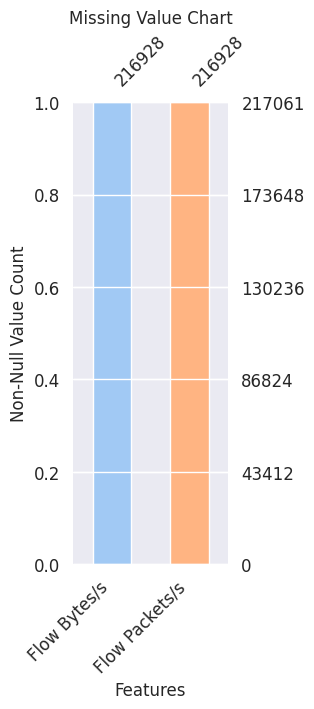

In [103]:
sns.set_palette('pastel')
colors = sns.color_palette()

missing_vals = [col for col in data.columns if data[col].isna().any()]

fig, ax = plt.subplots(figsize = (2, 6))
msno.bar(data[missing_vals], ax = ax, fontsize = 12, color = colors)
ax.set_xlabel('Features', fontsize = 12)
ax.set_ylabel('Non-Null Value Count', fontsize = 12)
ax.set_title('Missing Value Chart', fontsize = 12)
plt.show()

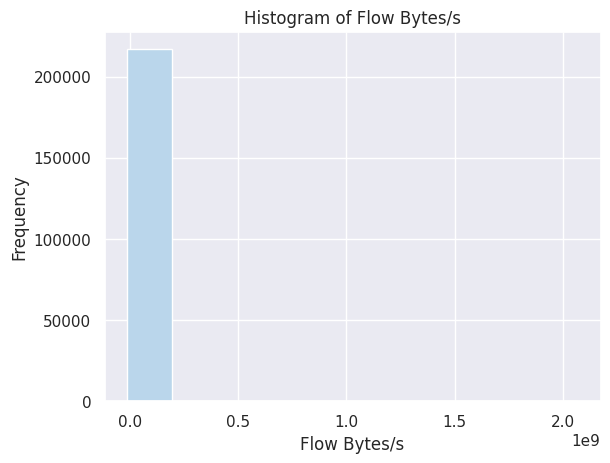

In [104]:
colors = sns.color_palette('Blues')
plt.hist(data['Flow Bytes/s'], color = colors[1])
plt.title('Histogram of Flow Bytes/s')
plt.xlabel('Flow Bytes/s')
plt.ylabel('Frequency')
plt.show()

In [105]:
med_flow_bytes = data['Flow Bytes/s'].median()
med_flow_packets = data['Flow Packets/s'].median()

print('Median of Flow Bytes/s: ', med_flow_bytes)
print('Median of Flow Packets/s: ', med_flow_packets)

Median of Flow Bytes/s:  2687.1938944009
Median of Flow Packets/s:  33.255460151547894


In [106]:
# Filling missing values with median
data['Flow Bytes/s'].fillna(med_flow_bytes, inplace = True)
data['Flow Packets/s'].fillna(med_flow_packets, inplace = True)

/tmp/ipython-input-1818654804.py:2: FutureWarning: A value is trying to be set on a copy of a DataFrame or Series through chained assignment using an inplace method.
The behavior will change in pandas 3.0. This inplace method will never work because the intermediate object on which we are setting values always behaves as a copy.

For example, when doing 'df[col].method(value, inplace=True)', try using 'df.method({col: value}, inplace=True)' or df[col] = df[col].method(value) instead, to perform the operation inplace on the original object.


  data['Flow Bytes/s'].fillna(med_flow_bytes, inplace = True)
/tmp/ipython-input-1818654804.py:3: FutureWarning: A value is trying to be set on a copy of a DataFrame or Series through chained assignment using an inplace method.
The behavior will change in pandas 3.0. This inplace method will never work because the intermediate object on which we are setting values always behaves as a copy.

For example, when doing 'df[col].method(value, inplace=Tru

In [107]:
print('Number of \'Flow Bytes/s\' missing values:', data['Flow Bytes/s'].isna().sum())
print('Number of \'Flow Packets/s\' missing values:', data['Flow Packets/s'].isna().sum())

Number of 'Flow Bytes/s' missing values: 0
Number of 'Flow Packets/s' missing values: 0


In [108]:
data['Attack Type'].value_counts()

,count
Attack Type,
Port Scan,51329
DDoS,45197
BENIGN,43782
DoS,36744
Web Attack,30582
Brute Force,9427


In [109]:
from sklearn.preprocessing import LabelEncoder

le = LabelEncoder()
data['Attack Number'] = le.fit_transform(data['Attack Type'])

print(data['Attack Number'].unique())

[3 2 1 4 0 5]


In [110]:
# Printing corresponding attack type for each encoded value
encoded_values = data['Attack Number'].unique()
for val in sorted(encoded_values):
    print(f"{val}: {le.inverse_transform([val])[0]}")

0: BENIGN
1: Brute Force
2: DDoS
3: DoS
4: Port Scan
5: Web Attack


In [111]:
corr = data.corr(numeric_only = True).round(2)
corr.style.background_gradient(cmap = 'coolwarm', axis = None).format(precision = 2)

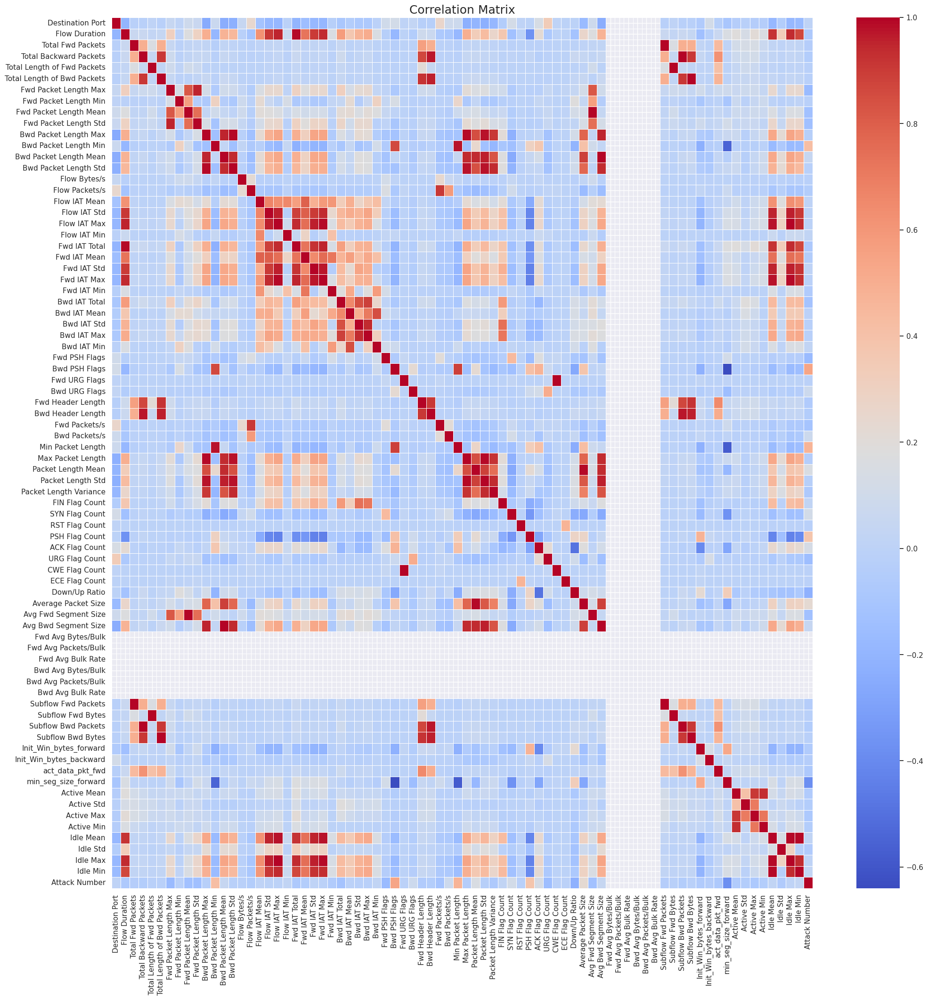

In [112]:
fig, ax = plt.subplots(figsize = (24, 24))
sns.heatmap(corr, cmap = 'coolwarm', annot = False, linewidth = 0.5)
plt.title('Correlation Matrix', fontsize = 18)
plt.show()

In [113]:
# Positive correlation features for 'Attack Number'
pos_corr_features = corr['Attack Number'][(corr['Attack Number'] > 0) & (corr['Attack Number'] < 1)].index.tolist()

print("Features with positive correlation with 'Attack Number':\n")
for i, feature in enumerate(pos_corr_features, start = 1):
    corr_value = corr.loc[feature, 'Attack Number']
    print('{:<3} {:<24} :{}'.format(f'{i}.', feature, corr_value))

Features with positive correlation with 'Attack Number':

1.  Destination Port         :0.01
2.  Bwd Packet Length Min    :0.42
3.  Bwd Packet Length Mean   :0.05
4.  Flow IAT Mean            :0.01
5.  Flow IAT Min             :0.02
6.  Fwd IAT Std              :0.01
7.  Bwd IAT Min              :0.02
8.  Bwd PSH Flags            :0.54
9.  Bwd URG Flags            :0.08
10. Bwd Packets/s            :0.08
11. Min Packet Length        :0.47
12. Packet Length Mean       :0.15
13. FIN Flag Count           :0.02
14. SYN Flag Count           :0.11
15. PSH Flag Count           :0.38
16. ACK Flag Count           :0.13
17. Average Packet Size      :0.23
18. Avg Bwd Segment Size     :0.05
19. Idle Mean                :0.02
20. Idle Max                 :0.01
21. Idle Min                 :0.03


In [114]:
print(f'Number of considerable important features: {len(pos_corr_features)}')

Number of considerable important features: 21


In [115]:
# Checking for columns with zero standard deviation (the blank squares in the heatmap)
std = data.std(numeric_only = True)
zero_std_cols = std[std == 0].index.tolist()
zero_std_cols

['Fwd Avg Bytes/Bulk',
 'Fwd Avg Packets/Bulk',
 'Fwd Avg Bulk Rate',
 'Bwd Avg Bytes/Bulk',
 'Bwd Avg Packets/Bulk',
 'Bwd Avg Bulk Rate']

In [116]:
# Data sampling for data analysis
sample_size = int(0.2 * len(data)) # 20% of the original size
sampled_data = data.sample(n = sample_size, replace = False, random_state = 0)
sampled_data.shape

(43412, 79)

In [117]:
# To assess if a sample is representative of the population and comparison of descriptive statistics (mean)
numeric_cols = data.select_dtypes(include = [np.number]).columns.tolist()
print('Descriptive Statistics Comparison (mean):\n')
print('{:<32s}{:<22s}{:<22s}{}'.format('Feature', 'Original Dataset', 'Sampled Dataset', 'Variation Percentage'))
print('-' * 96)

high_variations = []
for col in numeric_cols:
    old = data[col].describe()[1]
    new = sampled_data[col].describe()[1]
    if old == 0:
        pct = 0
    else:
        pct = abs((new - old) / old)
    if pct * 100 > 5:
        high_variations.append((col, pct * 100))
    print('{:<32s}{:<22.6f}{:<22.6f}{:<2.2%}'.format(col, old, new, pct))

Descriptive Statistics Comparison (mean):

Feature                         Original Dataset      Sampled Dataset       Variation Percentage
------------------------------------------------------------------------------------------------
Destination Port                5112.250068           5136.616442           0.48%
Flow Duration                   19294098.191269       19366684.944232       0.38%
Total Fwd Packets               4.639935              4.767138              2.74%
Total Backward Packets          4.712767              4.879480              3.54%
Total Length of Fwd Packets     297.678680            284.684534            4.37%
Total Length of Bwd Packets     5606.847084           6161.225306           9.89%
Fwd Packet Length Max           117.517983            119.148254            1.39%
Fwd Packet Length Min           11.136556             11.615521             4.30%
Fwd Packet Length Mean          32.844205             33.872055             3.13%
Fwd Packet Length Std    

/tmp/ipython-input-580325769.py:9: FutureWarning: Series.__getitem__ treating keys as positions is deprecated. In a future version, integer keys will always be treated as labels (consistent with DataFrame behavior). To access a value by position, use `ser.iloc[pos]`
  old = data[col].describe()[1]
/tmp/ipython-input-580325769.py:10: FutureWarning: Series.__getitem__ treating keys as positions is deprecated. In a future version, integer keys will always be treated as labels (consistent with DataFrame behavior). To access a value by position, use `ser.iloc[pos]`
  new = sampled_data[col].describe()[1]
/tmp/ipython-input-580325769.py:9: FutureWarning: Series.__getitem__ treating keys as positions is deprecated. In a future version, integer keys will always be treated as labels (consistent with DataFrame behavior). To access a value by position, use `ser.iloc[pos]`
  old = data[col].describe()[1]
/tmp/ipython-input-580325769.py:10: FutureWarning: Series.__getitem__ treating keys as positio

Flow IAT Max                    16879737.380529       16948609.770133       0.41%
Flow IAT Min                    236453.271974         223825.059269         5.34%
Fwd IAT Total                   18507017.056178       18583796.159357       0.41%
Fwd IAT Mean                    3467661.509977        3511338.243802        1.26%
Fwd IAT Std                     6512877.404661        6513777.863850        0.01%
Fwd IAT Max                     16401127.164705       16464956.499516       0.39%
Fwd IAT Min                     590775.428078         636223.023219         7.69%
Bwd IAT Total                   7386776.848835        7551463.798880        2.23%
Bwd IAT Mean                    1655637.920628        1726675.136697        4.29%
Bwd IAT Std                     2035199.521411        2066124.939984        1.52%
Bwd IAT Max                     5502493.100691        5669664.965148        3.04%
Bwd IAT Min                     662681.430372         730470.640353         10.23%
Fwd PSH Flags  

/tmp/ipython-input-580325769.py:9: FutureWarning: Series.__getitem__ treating keys as positions is deprecated. In a future version, integer keys will always be treated as labels (consistent with DataFrame behavior). To access a value by position, use `ser.iloc[pos]`
  old = data[col].describe()[1]
/tmp/ipython-input-580325769.py:10: FutureWarning: Series.__getitem__ treating keys as positions is deprecated. In a future version, integer keys will always be treated as labels (consistent with DataFrame behavior). To access a value by position, use `ser.iloc[pos]`
  new = sampled_data[col].describe()[1]
/tmp/ipython-input-580325769.py:9: FutureWarning: Series.__getitem__ treating keys as positions is deprecated. In a future version, integer keys will always be treated as labels (consistent with DataFrame behavior). To access a value by position, use `ser.iloc[pos]`
  old = data[col].describe()[1]
/tmp/ipython-input-580325769.py:10: FutureWarning: Series.__getitem__ treating keys as positio

Max Packet Length               2077.040588           2071.650811           0.26%
Packet Length Mean              397.199305            396.192583            0.25%
Packet Length Std               674.722526            671.729173            0.44%
Packet Length Variance          1428420.386315        1416917.842520        0.81%
FIN Flag Count                  0.055597              0.055492              0.19%
SYN Flag Count                  0.101695              0.102115              0.41%
RST Flag Count                  0.000249              0.000253              1.85%
PSH Flag Count                  0.502905              0.504446              0.31%
ACK Flag Count                  0.421172              0.417281              0.92%
URG Flag Count                  0.033000              0.033908              2.75%
CWE Flag Count                  0.000032              0.000023              28.57%
ECE Flag Count                  0.000064              0.000092              42.86%
Down/Up Ratio 

/tmp/ipython-input-580325769.py:9: FutureWarning: Series.__getitem__ treating keys as positions is deprecated. In a future version, integer keys will always be treated as labels (consistent with DataFrame behavior). To access a value by position, use `ser.iloc[pos]`
  old = data[col].describe()[1]
/tmp/ipython-input-580325769.py:10: FutureWarning: Series.__getitem__ treating keys as positions is deprecated. In a future version, integer keys will always be treated as labels (consistent with DataFrame behavior). To access a value by position, use `ser.iloc[pos]`
  new = sampled_data[col].describe()[1]
/tmp/ipython-input-580325769.py:9: FutureWarning: Series.__getitem__ treating keys as positions is deprecated. In a future version, integer keys will always be treated as labels (consistent with DataFrame behavior). To access a value by position, use `ser.iloc[pos]`
  old = data[col].describe()[1]
/tmp/ipython-input-580325769.py:10: FutureWarning: Series.__getitem__ treating keys as positio

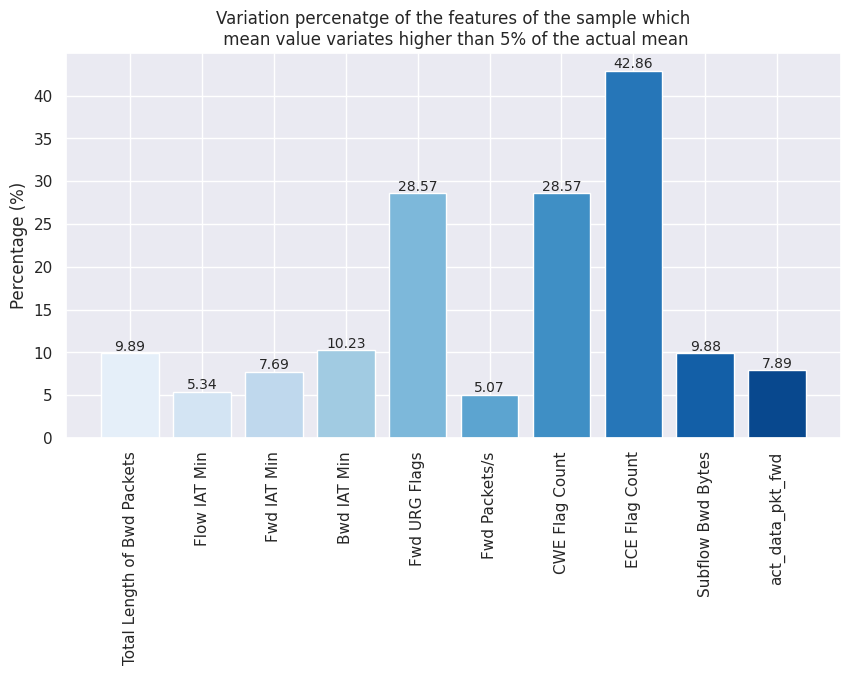

In [118]:
labels = [t[0] for t in high_variations]
values = [t[1] for t in high_variations]

colors = sns.color_palette('Blues', n_colors=len(labels))
fig, ax = plt.subplots(figsize = (10, 5))
ax.bar(labels, values, color = colors)

for i in range(len(labels)):
    ax.text(i, values[i], str(round(values[i], 2)), ha = 'center', va = 'bottom', fontsize = 10)

plt.xticks(rotation = 90)
ax.set_title('Variation percenatge of the features of the sample which\n mean value variates higher than 5% of the actual mean')
ax.set_ylabel('Percentage (%)')
ax.set_yticks(np.arange(0, 41, 5))
plt.show()

In [119]:
# Printing the unique value count
indent = '{:<3} {:<30}: {}'
print('Unique value count for: ')
for i, feature in enumerate(list(sampled_data.columns)[:-1], start = 1):
    print(indent.format(f'{i}.', feature, sampled_data[feature].nunique()))

Unique value count for: 
1.  Destination Port              : 2680
2.  Flow Duration                 : 28795
3.  Total Fwd Packets             : 147
4.  Total Backward Packets        : 164
5.  Total Length of Fwd Packets   : 1738
6.  Total Length of Bwd Packets   : 2444
7.  Fwd Packet Length Max         : 961
8.  Fwd Packet Length Min         : 329
9.  Fwd Packet Length Mean        : 3219
10. Fwd Packet Length Std         : 4762
11. Bwd Packet Length Max         : 991
12. Bwd Packet Length Min         : 773
13. Bwd Packet Length Mean        : 2747
14. Bwd Packet Length Std         : 2834
15. Flow Bytes/s                  : 30288
16. Flow Packets/s                : 29860
17. Flow IAT Mean                 : 29059
18. Flow IAT Std                  : 16831
19. Flow IAT Max                  : 20745
20. Flow IAT Min                  : 7259
21. Fwd IAT Total                 : 11250
22. Fwd IAT Mean                  : 13006
23. Fwd IAT Std                   : 11954
24. Fwd IAT Max              

In [120]:
# Correlation matrix for sampled data
corr_matrix = sampled_data.corr(numeric_only = True).round(2)
corr_matrix.style.background_gradient(cmap = 'coolwarm', axis = None).format(precision = 2)

/usr/local/lib/python3.11/dist-packages/numpy/lib/_function_base_impl.py:2922: RuntimeWarning: invalid value encountered in divide
  c /= stddev[:, None]
/usr/local/lib/python3.11/dist-packages/numpy/lib/_function_base_impl.py:2923: RuntimeWarning: invalid value encountered in divide
  c /= stddev[None, :]


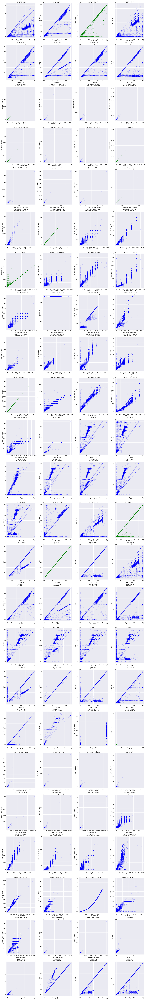

In [121]:
# Plotting the pairs of strongly positive correlated features in the sampled_data that have a correlation coefficient of 0.85 or higher
cols = list(sampled_data.columns)[:-2]
high_corr_pairs = []
corr_th = 0.85

for i in range(len(cols)):
  for j in range(i + 1, len(cols)):
    val = sampled_data[cols[i]].corr(sampled_data[cols[j]])
    # If the correlation coefficient is NaN or below the threshold, skip to the next pair
    if np.isnan(val) or val < corr_th:
      continue
    high_corr_pairs.append((val, cols[i], cols[j]))

size, cols = len(high_corr_pairs), 4
rows, rem =  size // cols, size % cols
if rem:
  rows += 1

fig, axs = plt.subplots(rows, cols, figsize = (24, int(size * 1.7)))
for i in range(rows):
    for j in range(cols):
      try:
        val, x, y = high_corr_pairs[i * cols + j]
        if val > 0.99:
          axs[i, j].scatter(sampled_data[x], sampled_data[y], color = 'green', alpha = 0.1)
        else:
          axs[i, j].scatter(sampled_data[x], sampled_data[y], color = 'blue', alpha = 0.1)
        axs[i, j].set_xlabel(x)
        axs[i, j].set_ylabel(y)
        axs[i, j].set_title(f'{x} vs\n{y} ({val:.2f})')
      except IndexError:
        fig.delaxes(axs[i, j])

fig.tight_layout()
plt.show()

In [122]:
sampled_data.drop('Attack Number', axis = 1, inplace = True)
data.drop('Attack Number', axis = 1, inplace = True)

In [123]:
# Identifying outliers
numeric_data = sampled_data.select_dtypes(include = ['float', 'int'])
q1 = numeric_data.quantile(0.25)
q3 = numeric_data.quantile(0.75)
iqr = q3 - q1
outlier = (numeric_data < (q1 - 1.5 * iqr)) | (numeric_data > (q3 + 1.5 * iqr))
outlier_count = outlier.sum()
outlier_percentage = round(outlier.mean() * 100, 2)
outlier_stats = pd.concat([outlier_count, outlier_percentage], axis = 1)
outlier_stats.columns = ['Outlier Count', 'Outlier Percentage']

print(outlier_stats)

                             Outlier Count  Outlier Percentage
Destination Port                      3028                6.98
Flow Duration                         8858               20.40
Total Fwd Packets                     1791                4.13
Total Backward Packets                2429                5.60
Total Length of Fwd Packets           9493               21.87
Total Length of Bwd Packets            267                0.62
Fwd Packet Length Max                 9514               21.92
Fwd Packet Length Min                 8933               20.58
Fwd Packet Length Mean                2558                5.89
Fwd Packet Length Std                 9079               20.91
Bwd Packet Length Max                  693                1.60
Bwd Packet Length Min                 9544               21.98
Bwd Packet Length Mean                   4                0.01
Bwd Packet Length Std                 1479                3.41
Flow Bytes/s                          7500             

In [124]:
# Identifying outliers based on attack type
outlier_counts = {}
for i in numeric_data:
    for attack_type in sampled_data['Attack Type'].unique():
        attack_data = sampled_data[i][sampled_data['Attack Type'] == attack_type]
        q1, q3 = np.percentile(attack_data, [25, 75])
        iqr = q3 - q1
        lower_bound = q1 - 1.5 * iqr
        upper_bound = q3 + 1.5 * iqr
        num_outliers = ((attack_data < lower_bound) | (attack_data > upper_bound)).sum()
        outlier_percent = num_outliers / len(attack_data) * 100
        outlier_counts[(i, attack_type)] = (num_outliers, outlier_percent)

for i in numeric_data:
  print(f'Feature: {i}')
  for attack_type in sampled_data['Attack Type'].unique():
    num_outliers, outlier_percent = outlier_counts[(i, attack_type)]
    print(f'- {attack_type}: {num_outliers} ({outlier_percent:.2f}%)')
  print()

Feature: Destination Port
- Port Scan: 1347 (13.01%)
- DDoS: 0 (0.00%)
- DoS: 0 (0.00%)
- BENIGN: 1883 (21.44%)
- Web Attack: 445 (7.31%)
- Brute Force: 31 (1.62%)

Feature: Flow Duration
- Port Scan: 61 (0.59%)
- DDoS: 1569 (17.57%)
- DoS: 1442 (19.66%)
- BENIGN: 1975 (22.49%)
- Web Attack: 1046 (17.17%)
- Brute Force: 473 (24.70%)

Feature: Total Fwd Packets
- Port Scan: 47 (0.45%)
- DDoS: 302 (3.38%)
- DoS: 89 (1.21%)
- BENIGN: 1612 (18.36%)
- Web Attack: 914 (15.01%)
- Brute Force: 0 (0.00%)

Feature: Total Backward Packets
- Port Scan: 5 (0.05%)
- DDoS: 0 (0.00%)
- DoS: 945 (12.88%)
- BENIGN: 1251 (14.25%)
- Web Attack: 559 (9.18%)
- Brute Force: 0 (0.00%)

Feature: Total Length of Fwd Packets
- Port Scan: 34 (0.33%)
- DDoS: 1674 (18.74%)
- DoS: 2041 (27.82%)
- BENIGN: 1623 (18.48%)
- Web Attack: 516 (8.47%)
- Brute Force: 0 (0.00%)

Feature: Total Length of Bwd Packets
- Port Scan: 405 (3.91%)
- DDoS: 0 (0.00%)
- DoS: 1546 (21.07%)
- BENIGN: 1661 (18.92%)
- Web Attack: 1549 (25.4

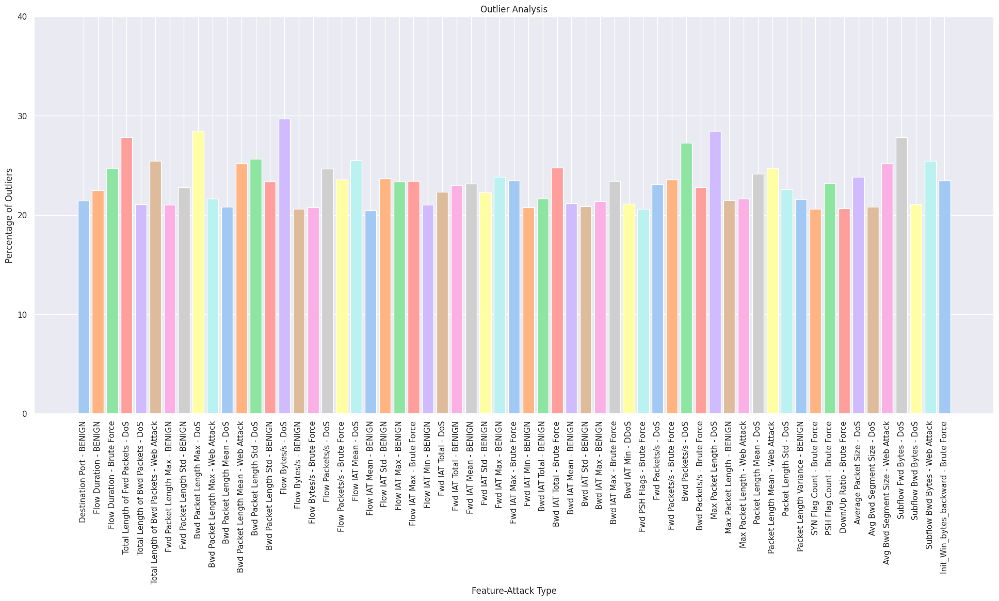

In [125]:
# Plotting the percentage of outliers that are higher than 20%
fig, ax = plt.subplots(figsize = (24, 10))
for i in numeric_data:
    for attack_type in sampled_data['Attack Type'].unique():
        num_outliers, outlier_percent = outlier_counts[(i, attack_type)]
        if outlier_percent > 20:
            ax.bar(f'{i} - {attack_type}', outlier_percent)

ax.set_xlabel('Feature-Attack Type')
ax.set_ylabel('Percentage of Outliers')
ax.set_title('Outlier Analysis')
ax.set_yticks(np.arange(0, 41, 10))
plt.xticks(rotation = 90)
plt.show()

/tmp/ipython-input-323780027.py:5: FutureWarning: 

Passing `palette` without assigning `hue` is deprecated and will be removed in v0.14.0. Assign the `x` variable to `hue` and set `legend=False` for the same effect.

  ax = sns.countplot(x = 'Attack Type', data = attacks, palette = 'pastel', order = attacks['Attack Type'].value_counts().index)


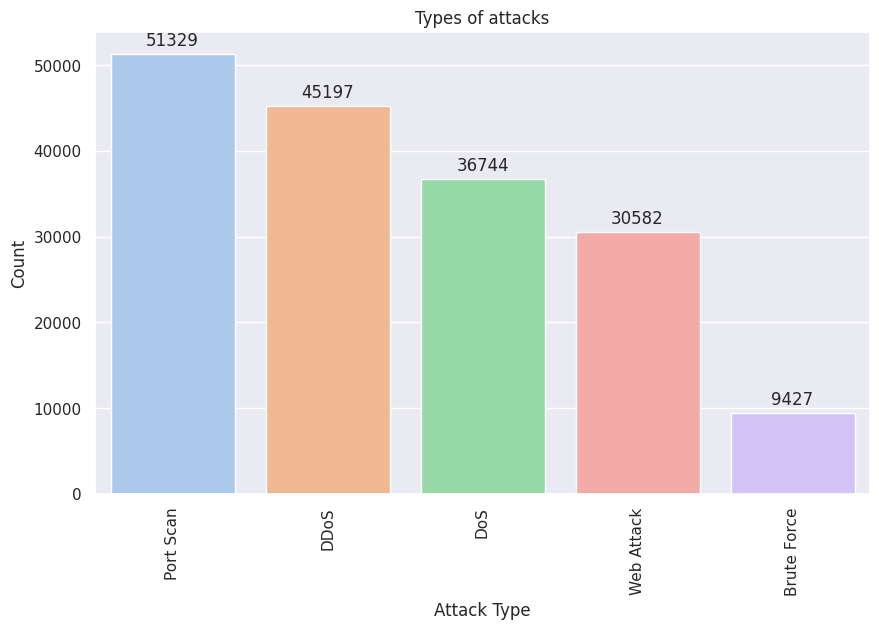

In [126]:
# Different 'Attack Type' in the main dataset excluding 'BENIGN'
attacks = data.loc[data['Attack Type'] != 'BENIGN']

plt.figure(figsize = (10, 6))
ax = sns.countplot(x = 'Attack Type', data = attacks, palette = 'pastel', order = attacks['Attack Type'].value_counts().index)
plt.title('Types of attacks')
plt.xlabel('Attack Type')
plt.ylabel('Count')
plt.xticks(rotation = 90)

for p in ax.patches:
    ax.annotate(f'{p.get_height():.0f}', (p.get_x() + p.get_width() / 2, p.get_height() + 1000), ha = 'center')

plt.show()

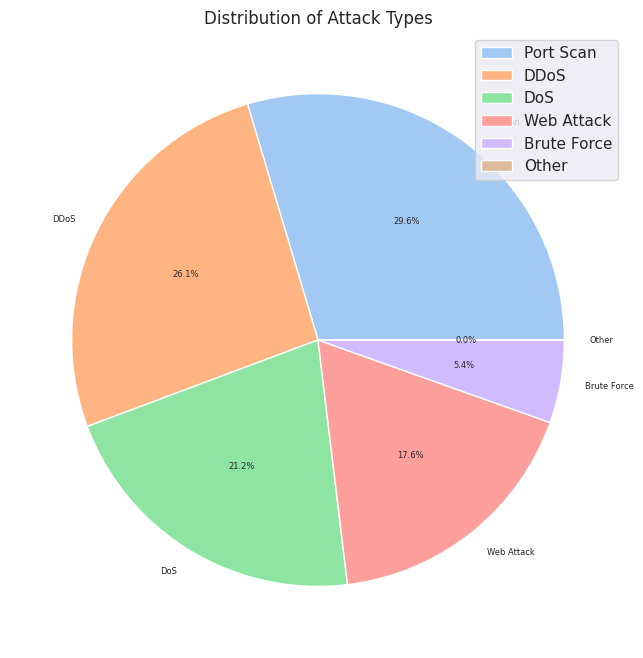

In [127]:
attack_counts = attacks['Attack Type'].value_counts()
threshold = 0.005
percentages = attack_counts / attack_counts.sum()
small_slices = percentages[percentages < threshold].index.tolist()
attack_counts['Other'] = attack_counts[small_slices].sum()
attack_counts.drop(small_slices, inplace = True)

sns.set_palette('pastel')
plt.figure(figsize = (8, 8))
plt.pie(attack_counts.values, labels = attack_counts.index, autopct = '%1.1f%%', textprops={'fontsize': 6})
plt.title('Distribution of Attack Types')
plt.legend(attack_counts.index, loc = 'best')
plt.show()

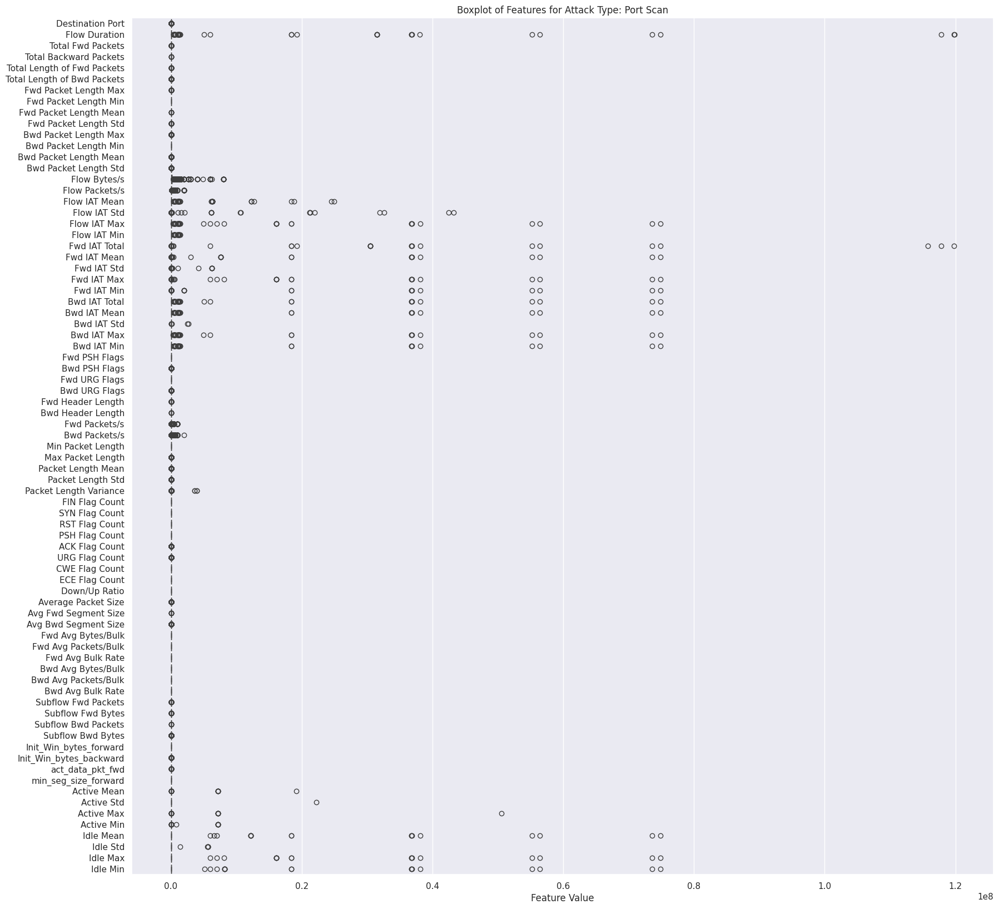

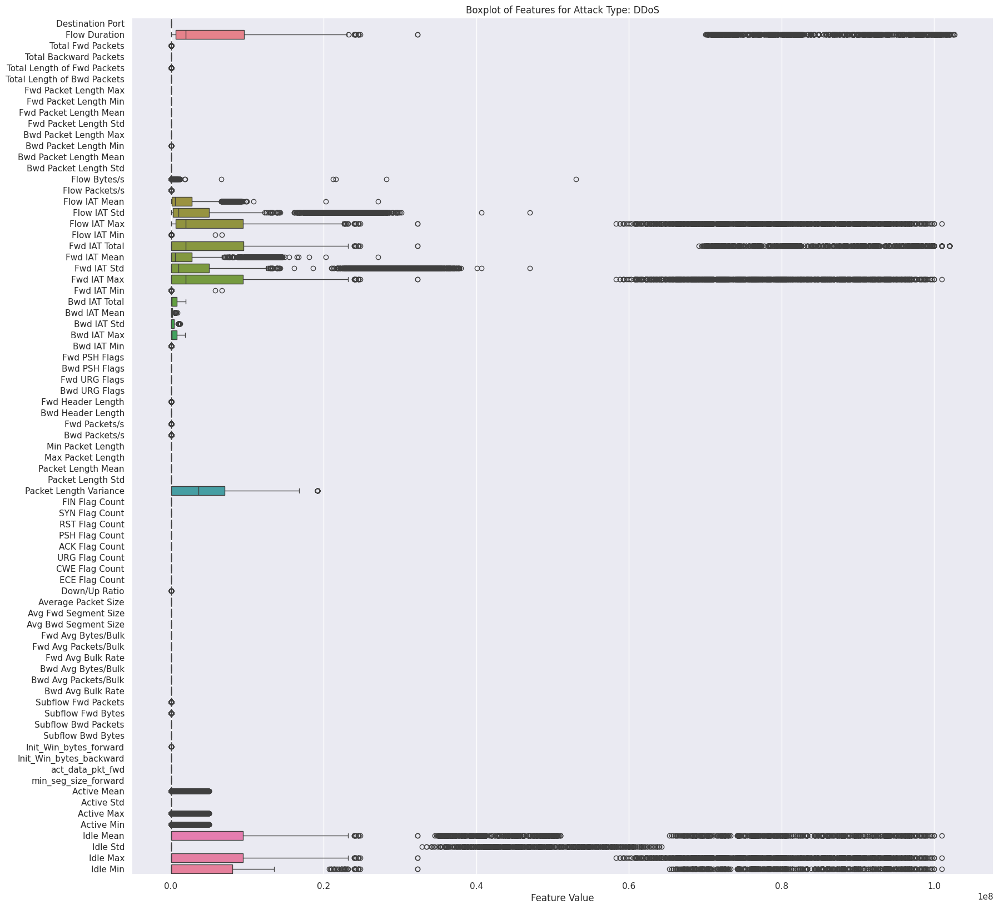

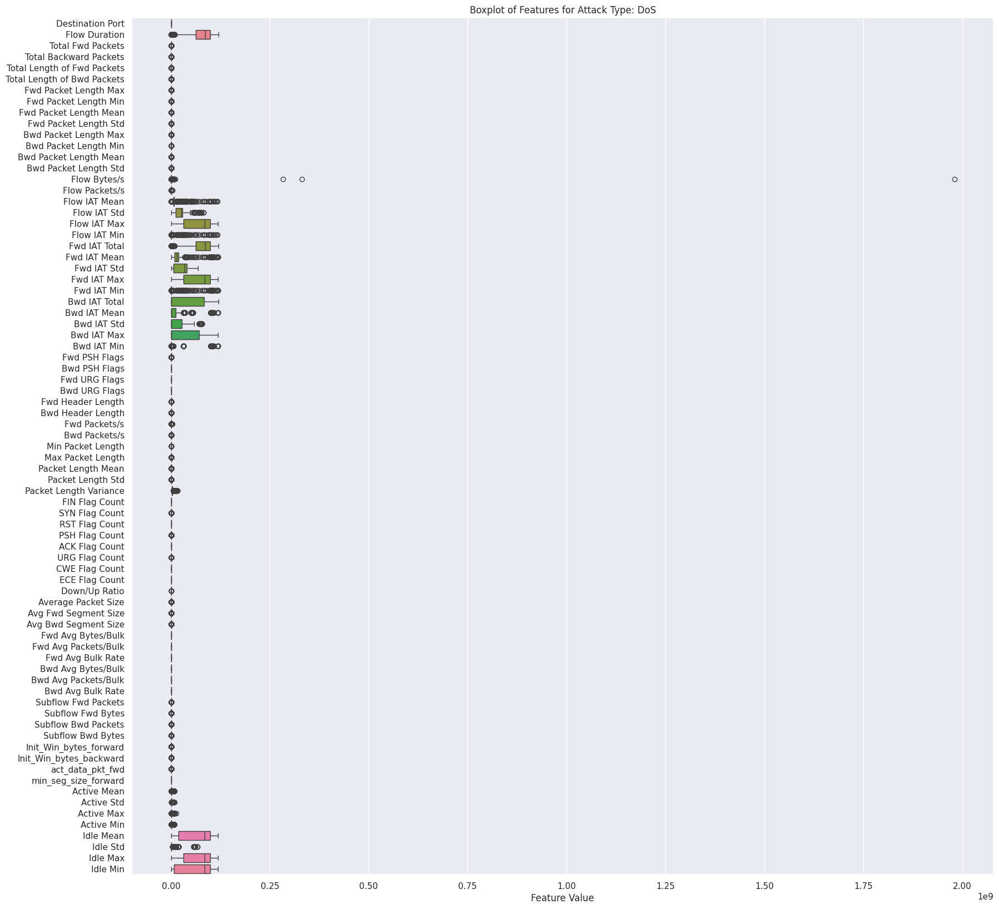

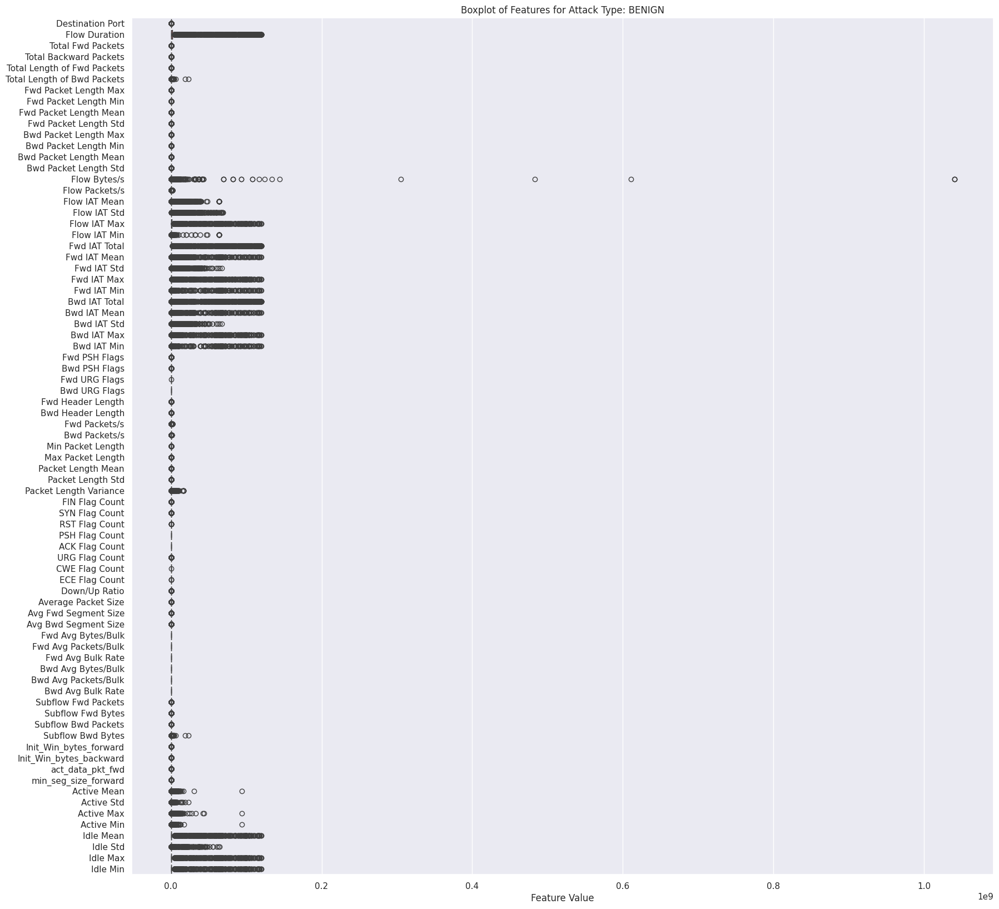

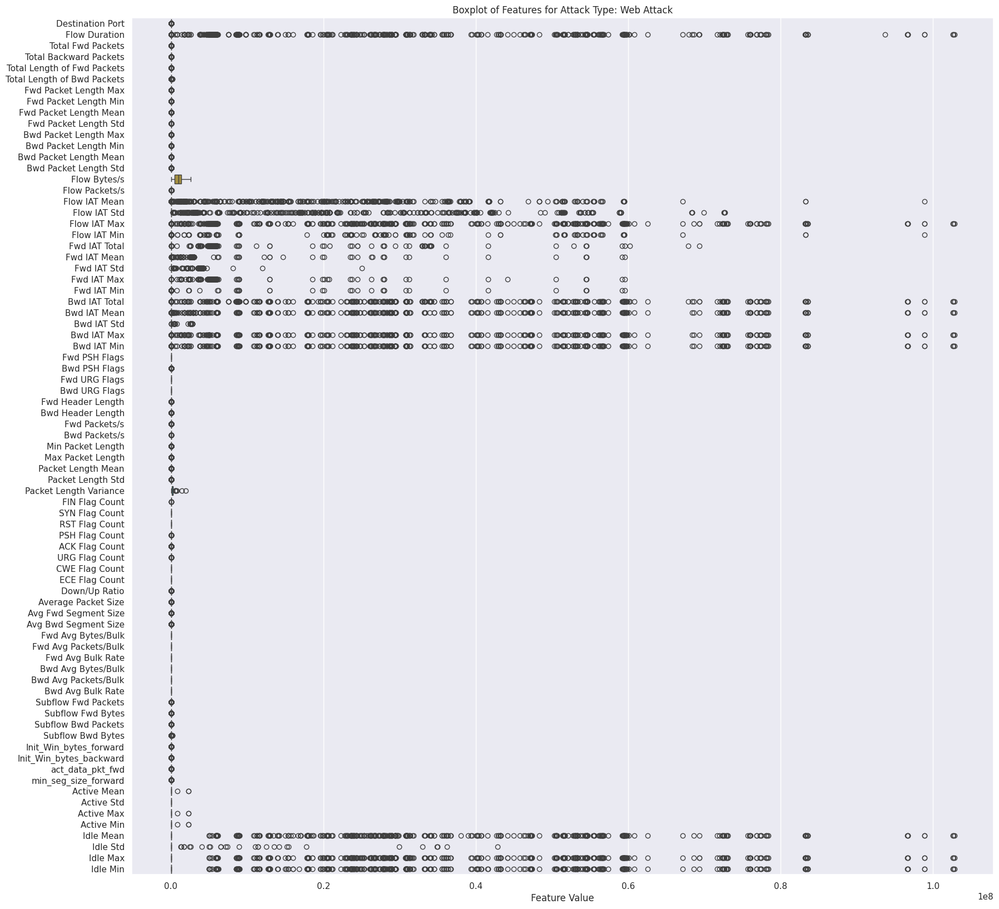

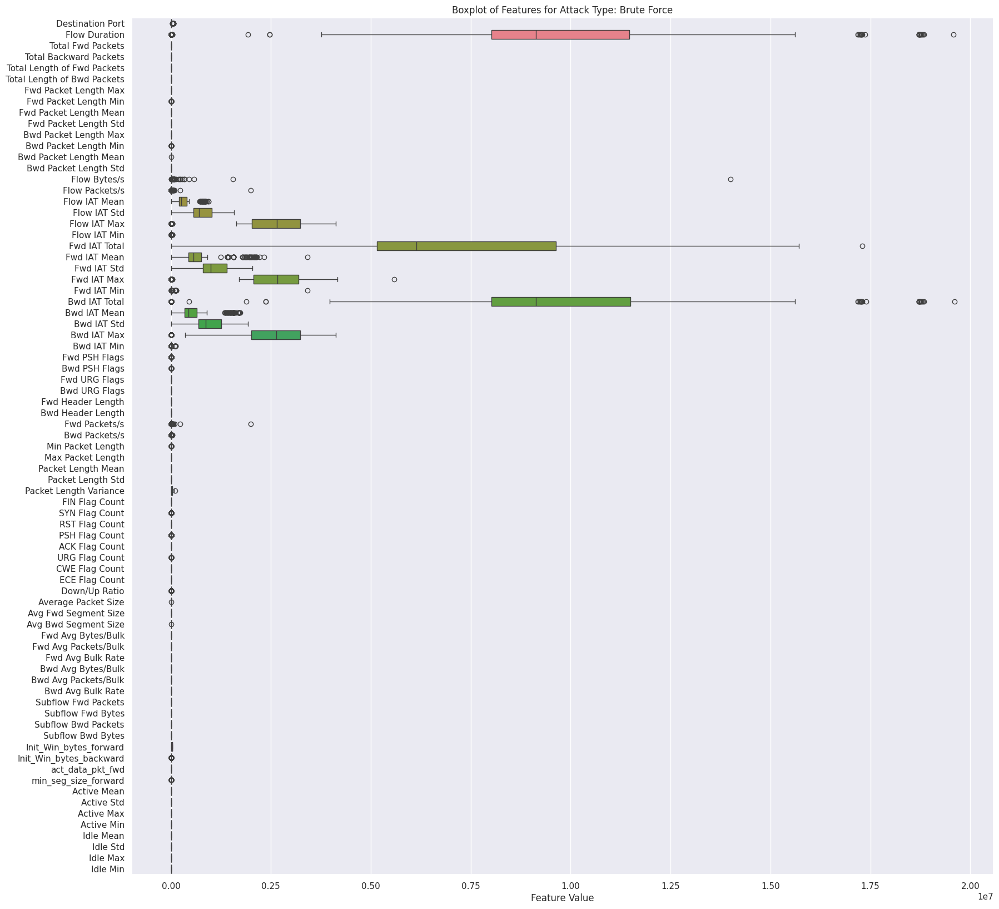

In [128]:
# Creating a boxplot for each attack type with the columns of sampled dataset
for attack_type in sampled_data['Attack Type'].unique():
    attack_data = sampled_data[sampled_data['Attack Type'] == attack_type]
    plt.figure(figsize=(20, 20))
    sns.boxplot(data = attack_data.drop(columns = ['Attack Type']), orient = 'h')
    plt.title(f'Boxplot of Features for Attack Type: {attack_type}')
    plt.xlabel('Feature Value')
    plt.show()

In [129]:
data.groupby('Attack Type').first()

,Destination Port,Flow Duration,Total Fwd Packets,Total Backward Packets,Total Length of Fwd Packets,Total Length of Bwd Packets,Fwd Packet Length Max,Fwd Packet Length Min,Fwd Packet Length Mean,Fwd Packet Length Std,Bwd Packet Length Max,Bwd Packet Length Min,Bwd Packet Length Mean,Bwd Packet Length Std,Flow Bytes/s,Flow Packets/s,Flow IAT Mean,Flow IAT Std,Flow IAT Max,Flow IAT Min,Fwd IAT Total,Fwd IAT Mean,Fwd IAT Std,Fwd IAT Max,Fwd IAT Min,Bwd IAT Total,Bwd IAT Mean,Bwd IAT Std,Bwd IAT Max,Bwd IAT Min,Fwd PSH Flags,Bwd PSH Flags,Fwd URG Flags,Bwd URG Flags,Fwd Header Length,Bwd Header Length,Fwd Packets/s,Bwd Packets/s,Min Packet Length,Max Packet Length,Packet Length Mean,Packet Length Std,Packet Length Variance,FIN Flag Count,SYN Flag Count,RST Flag Count,PSH Flag Count,ACK Flag Count,URG Flag Count,CWE Flag Count,ECE Flag Count,Down/Up Ratio,Average Packet Size,Avg Fwd Segment Size,Avg Bwd Segment Size,Fwd Avg Bytes/Bulk,Fwd Avg Packets/Bulk,Fwd Avg Bulk Rate,Bwd Avg Bytes/Bulk,Bwd Avg Packets/Bulk,Bwd Avg Bulk Rate,Subflow Fwd Packets,Subflow Fwd Bytes,Subflow Bwd Packets,Subflow Bwd Bytes,Init_Win_bytes_forward,Init_Win_bytes_backward,act_data_pkt_fwd,min_seg_size_forward,Active Mean,Active Std,Active Max,Active Min,Idle Mean,Idle Std,Idle Max,Idle Min
Attack Type,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,
BENIGN,443,5577389,5,1,123.0,46.0,46.0,0.0,24.600000,23.276598,46.0,46.0,46.000000,0.000000,30.300917,1.075772,1.115478e+06,2.466225e+06,5527113.0,48.0,5577389.0,1.394347e+06,2.755220e+06,5527113.0,48.0,0.0,0.0000,0.000000e+00,0.0,0.0,1,0,0,0,160,32,0.896477,0.179295,0.0,46.0,30.714286,21.684974,4.702381e+02,0,1,0,0,1,0,0,0,0.0,35.833333,24.600000,46.000000,0,0,0,0,0,0,5,123,1,46,360,357,2,32,37015.0,0.0,37015.0,37015.0,5527113.0,0.0,5527113.0,5527113.0
Brute Force,21,8689973,9,15,102.0,188.0,23.0,0.0,11.333333,8.986100,34.0,0.0,12.533333,14.549750,33.371795,2.761804,3.778249e+05,9.819118e+05,3040786.0,3.0,5608124.0,7.010155e+05,1.297246e+06,2928575.0,247.0,8689872.0,620705.1429,1.212147e+06,3040786.0,3.0,0,0,0,0,296,488,1.035676,1.726127,0.0,34.0,11.600000,12.513326,1.565833e+02,0,0,0,1,0,0,0,0,1.0,12.083333,11.333333,12.533333,0,0,0,0,0,0,9,102,15,188,29200,227,6,32,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0
DDoS,80,8098507,7,5,50.0,11607.0,20.0,0.0,7.142857,6.094494,7215.0,0.0,2321.400000,3327.769794,1439.401114,1.481755,7.362279e+05,1.863101e+06,6075462.0,4.0,8016239.0,1.336040e+06,2.447737e+06,6075462.0,165.0,83027.0,20756.7500,4.084723e+04,82025.0,4.0,0,0,0,0,152,112,0.864357,0.617398,0.0,7215.0,897.153846,2250.514898,5.064817e+06,0,0,0,0,1,0,0,0,0.0,971.916667,7.142857,2321.400000,0,0,0,0,0,0,7,50,5,11607,256,229,5,20,1940002.0,0.0,1940002.0,1940002.0,6075462.0,0.0,6075462.0,6075462.0
DoS,80,85158082,7,5,361.0,11595.0,355.0,0.0,51.571429,133.818107,8688.0,0.0,2319.000000,3774.237539,140.397714,0.140914,7.741644e+06,2.560000e+07,85000000.0,1.0,85000000.0,1.420000e+07,3.470000e+07,85000000.0,1.0,146452.0,36613.0000,6.525404e+04,134130.0,85.0,0,0,0,0,220,168,0.082200,0.058714,0.0,8688.0,919.692308,2466.416104,6.083208e+06,0,0,0,0,1,0,0,0,0.0,996.333333,51.571429,2319.000000,0,0,0,0,0,0,7,361,5,11595,274,235,2,20,2982.0,0.0,2982.0,2982.0,85000000.0,0.0,85000000.0,85000000.0
Port Scan,84,44,1,1,0.0,6.0,0.0,0.0,0.000000,0.000000,6.0,6.0,6.000000,0.000000,136363.636400,45454.545450,4.400000e+01,0.000000e+00,44.0,44.0,0.0,0.000000e+00,0.000000e+00,0.0,0.0,0.0,0.0000,0.000000e+00,0.0,0.0,0,0,0,0,40,20,22727.272730,22727.272730,0.0,6.0,2.000000,3.464102,1.200000e+01,0,0,0,1,0,0,0,0,1.0,3.000000,0.000000,6.000000,0,0,0,0,0,0,1,0,1,6,29200,0,0,40,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0
Web Attack,80,5303380,3,1,0.0,0.0,0.0,0.0,0.000000,0.000000,0.0,0.0,0.000000,0.000000,0.000000,0.754236,1.767793e+06,3.061305e+06,5302684.0,129.0,5303380.0,2.651690e+06,3.749072e+06,5302684.0,696.0,0.0,0.0000,0.000000e+00,0.0,0.0,0,0,0,0,104,40,0.565677,0.188559,0.0,0.0,0.000000,0.000000,0.000000e+00,0,0,0,1,0,0,0,0,0.0,0

In [130]:
# For improving performance and reduce memory-related errors
old_memory_usage = data.memory_usage().sum() / 1024 ** 2
print(f'Initial memory usage: {old_memory_usage:.2f} MB')
for col in data.columns:
    col_type = data[col].dtype
    if col_type != object:
        c_min = data[col].min()
        c_max = data[col].max()
        # Downcasting float64 to float32
        if str(col_type).find('float') >= 0 and c_min > np.finfo(np.float32).min and c_max < np.finfo(np.float32).max:
            data[col] = data[col].astype(np.float32)

        # Downcasting int64 to int32
        elif str(col_type).find('int') >= 0 and c_min > np.iinfo(np.int32).min and c_max < np.iinfo(np.int32).max:
            data[col] = data[col].astype(np.int32)

new_memory_usage = data.memory_usage().sum() / 1024 ** 2
print(f"Final memory usage: {new_memory_usage:.2f} MB")

Initial memory usage: 130.83 MB
Final memory usage: 67.07 MB


In [131]:
# Calculating percentage reduction in memory usage
print(f'Reduced memory usage: {1 - (new_memory_usage / old_memory_usage):.2%}')

Reduced memory usage: 48.73%


In [132]:
# Dropping columns with only one unique value
num_unique = data.nunique()
one_variable = num_unique[num_unique == 1]
not_one_variable = num_unique[num_unique > 1].index

dropped_cols = one_variable.index
data = data[not_one_variable]

print('Dropped columns:')
dropped_cols

Dropped columns:


Index(['Fwd Avg Bytes/Bulk', 'Fwd Avg Packets/Bulk', 'Fwd Avg Bulk Rate',
       'Bwd Avg Bytes/Bulk', 'Bwd Avg Packets/Bulk', 'Bwd Avg Bulk Rate'],
      dtype='object')

In [133]:
data.shape

(217061, 72)

In [134]:
# Columns after removing non variant columns
data.columns

Index(['Destination Port', 'Flow Duration', 'Total Fwd Packets',
       'Total Backward Packets', 'Total Length of Fwd Packets',
       'Total Length of Bwd Packets', 'Fwd Packet Length Max',
       'Fwd Packet Length Min', 'Fwd Packet Length Mean',
       'Fwd Packet Length Std', 'Bwd Packet Length Max',
       'Bwd Packet Length Min', 'Bwd Packet Length Mean',
       'Bwd Packet Length Std', 'Flow Bytes/s', 'Flow Packets/s',
       'Flow IAT Mean', 'Flow IAT Std', 'Flow IAT Max', 'Flow IAT Min',
       'Fwd IAT Total', 'Fwd IAT Mean', 'Fwd IAT Std', 'Fwd IAT Max',
       'Fwd IAT Min', 'Bwd IAT Total', 'Bwd IAT Mean', 'Bwd IAT Std',
       'Bwd IAT Max', 'Bwd IAT Min', 'Fwd PSH Flags', 'Bwd PSH Flags',
       'Fwd URG Flags', 'Bwd URG Flags', 'Fwd Header Length',
       'Bwd Header Length', 'Fwd Packets/s', 'Bwd Packets/s',
       'Min Packet Length', 'Max Packet Length', 'Packet Length Mean',
       'Packet Length Std', 'Packet Length Variance', 'FIN Flag Count',
       'SYN Flag Co

In [135]:
from sklearn.preprocessing import StandardScaler
from sklearn.decomposition import IncrementalPCA
import pandas as pd
import numpy as np

# === 1. Separate features and labels ===
features = data.drop('Attack Type', axis=1)
attacks = data['Attack Type']

# === 2. Standardize the features ===
scaler = StandardScaler()
scaled_features = scaler.fit_transform(features)

# === 3. Apply Incremental PCA ===
size = len(features.columns) // 2  # Keep 50% of features
ipca = IncrementalPCA(n_components=size, batch_size=500)

# Train PCA incrementally on batches
for batch in np.array_split(scaled_features, max(1, len(scaled_features) // 500)):
    ipca.partial_fit(batch)

print(f'Information retained: {sum(ipca.explained_variance_ratio_):.2%}')

# === 4. Transform the scaled features ===
transformed_features = ipca.transform(scaled_features)

# === 5. Create DataFrame with PCA components and attach labels ===
new_data = pd.DataFrame(transformed_features, columns=[f'PC{i+1}' for i in range(size)])
new_data['Attack Type'] = attacks.values


Information retained: 98.64%


In [136]:
new_data.columns

Index(['PC1', 'PC2', 'PC3', 'PC4', 'PC5', 'PC6', 'PC7', 'PC8', 'PC9', 'PC10',
       'PC11', 'PC12', 'PC13', 'PC14', 'PC15', 'PC16', 'PC17', 'PC18', 'PC19',
       'PC20', 'PC21', 'PC22', 'PC23', 'PC24', 'PC25', 'PC26', 'PC27', 'PC28',
       'PC29', 'PC30', 'PC31', 'PC32', 'PC33', 'PC34', 'PC35', 'Attack Type'],
      dtype='object')

In [137]:
new_data['Attack Type'].value_counts()

,count
Attack Type,
Port Scan,51329
DDoS,45197
BENIGN,43782
DoS,36744
Web Attack,30582
Brute Force,9427


In [138]:
class_counts = new_data['Attack Type'].value_counts()

# Only keep classes with more than 10000 samples
selected_classes = class_counts[class_counts > 10000]
class_names = selected_classes.index

# Keep only rows with those selected classes
selected = new_data[new_data['Attack Type'].isin(class_names)]

dfs = []
for name in class_names:
    df = selected[selected['Attack Type'] == name]

    # Sample only if there are more than 10000 records
    if len(df) > 36000:
        df = df.sample(n=36000, random_state=0)

    dfs.append(df)

# Combine all sampled data
df = pd.concat(dfs, ignore_index=True)

# Show the final class distribution
df['Attack Type'].value_counts()


,count
Attack Type,
Port Scan,36000
DDoS,36000
BENIGN,36000
DoS,36000
Web Attack,30582


In [139]:
from imblearn.over_sampling import SMOTE

X = df.drop('Attack Type', axis=1)
y = df['Attack Type']

smote = SMOTE(sampling_strategy='auto', random_state=0)
X_upsampled, y_upsampled = smote.fit_resample(X, y)

blnc_data = pd.DataFrame(X_upsampled)
blnc_data['Attack Type'] = y_upsampled
blnc_data = blnc_data.sample(frac=1)

blnc_data['Attack Type'].value_counts()

,count
Attack Type,
Port Scan,36000
DDoS,36000
Web Attack,36000
BENIGN,36000
DoS,36000


In [140]:
from sklearn.model_selection import train_test_split


features = blnc_data.drop('Attack Type', axis = 1)
labels = blnc_data['Attack Type']

X_train, X_test, y_train, y_test = train_test_split(features, labels, test_size = 0.25, random_state = 0)

# First model : Random forest

In [141]:
from sklearn.ensemble import RandomForestClassifier
from sklearn.model_selection import  cross_val_score



rf1 = RandomForestClassifier(n_estimators= 100, max_features= None, max_depth= 12 ,random_state = 0)
rf1.fit(X_train, y_train)

cv_rf1 = cross_val_score(rf1, X_train, y_train, cv = 5)
print('Random Forest Model 2')
print(f'\nCross-validation scores:', ', '.join(map(str, cv_rf1)))
print(f'\nMean cross-validation score: {cv_rf1.mean():.4f}')


Random Forest Model 2

Cross-validation scores: 0.9962222222222222, 0.9971481481481481, 0.9974444444444445, 0.9976666666666667, 0.9964814814814815

Mean cross-validation score: 0.9970


# Second model : XGBOOST

In [142]:
from xgboost import XGBClassifier
from sklearn.model_selection import GridSearchCV
from sklearn.preprocessing import LabelEncoder
import numpy as np


# === 1. Label Encoding ===
le = LabelEncoder()
y_train_encoded = le.fit_transform(y_train)
num_classes = len(np.unique(y_train_encoded))
for i, class_name in enumerate(le.classes_):
    print(f"{i}: {class_name}")

0: BENIGN
1: DDoS
2: DoS
3: Port Scan
4: Web Attack


In [156]:
# === 2. Define parameter grid ===
from sklearn.model_selection import RandomizedSearchCV
from sklearn.model_selection import  cross_val_score

xgb = XGBClassifier(subsample= 1, objective = 'multi:softmax', num_class = 5, n_estimators= 500, min_child_weight= 1, max_depth= 5, learning_rate= 0.2, gamma= 0, colsample_bytree= 0.85,eval_metric='mlogloss',random_state=0)

xgb.fit(X_train, y_train_encoded)

cv_xgb = cross_val_score(xgb, X_train, y_train_encoded, cv = 10)
print('XGBOOST Model ')
print(f'\nCross-validation scores:', ', '.join(map(str, cv_xgb)))
print(f'\nMean cross-validation score: {cv_xgb.mean():.4f}')

XGBOOST Model 

Cross-validation scores: 0.9981481481481481, 0.9985185185185185, 0.9990370370370371, 0.9992592592592593, 0.9989629629629629, 0.9986666666666667, 0.9985185185185185, 0.9986666666666667, 0.9985925925925926, 0.9988888888888889

Mean cross-validation score: 0.9987


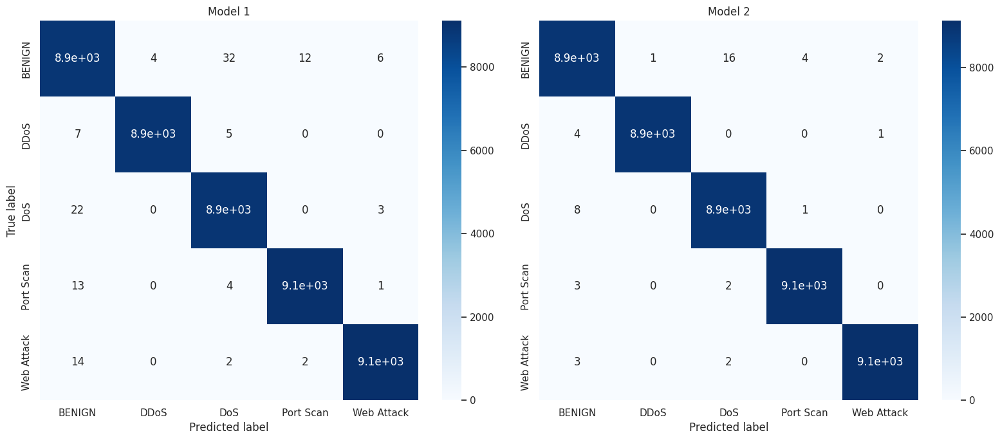

In [158]:
from sklearn.metrics import confusion_matrix
import seaborn as sns
import matplotlib.pyplot as plt

# Encode y_test to numeric labels
y_test_encoded = le.transform(y_test)

# Predict
y_pred_rf1 = rf1.predict(X_test)               # assuming rf1 uses original labels
y_pred_xgb = xgb.predict(X_test)                # numeric labels

# Confusion matrices
conf_matrix_model1 = confusion_matrix(y_test, y_pred_rf1)           # rf1 with original labels
conf_matrix_model2 = confusion_matrix(y_test_encoded, y_pred_xgb)  # xgb with encoded labels

# Class labels
class_labels = le.classes_

# Plotting
fig, axs = plt.subplots(1, 2, figsize=(16, 7))

sns.heatmap(conf_matrix_model1, annot=True, cmap='Blues', ax=axs[0],
            xticklabels=class_labels, yticklabels=class_labels)
axs[0].set_title('Model 1')
axs[0].set_xlabel('Predicted label')
axs[0].set_ylabel('True label')

sns.heatmap(conf_matrix_model2, annot=True, cmap='Blues', ax=axs[1],
            xticklabels=class_labels, yticklabels=class_labels)
axs[1].set_title('Model 2')
axs[1].set_xlabel('Predicted label')

fig.tight_layout()
plt.show()


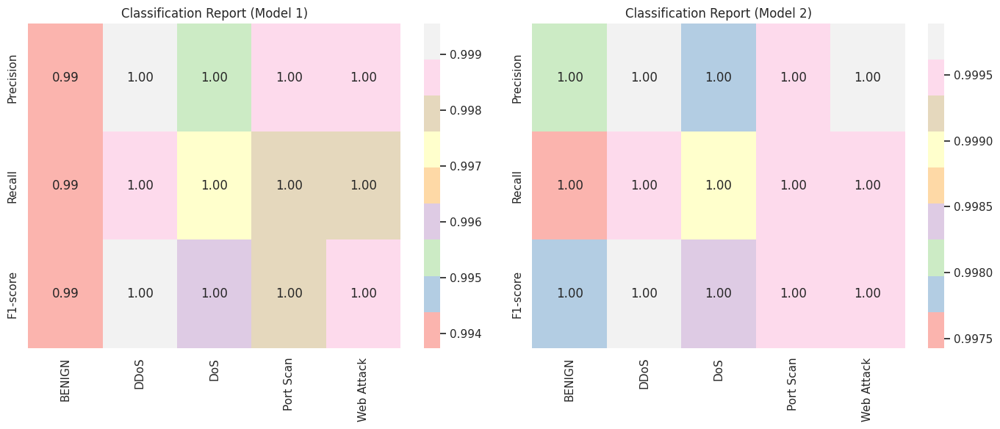

In [161]:
import numpy as np
import seaborn as sns
import matplotlib.pyplot as plt
from sklearn.metrics import classification_report

# Decode xgb numeric predictions to string labels
y_pred_xgb_labels = le.inverse_transform(y_pred_xgb)

# Use string labels for both models to match target_names
target_names = rf1.classes_  # assuming rf1 trained with string labels

metrics1 = classification_report(
    y_true=y_test,
    y_pred=y_pred_rf1,
    target_names=target_names,
    output_dict=True
)

metrics2 = classification_report(
    y_true=y_test,
    y_pred=y_pred_xgb_labels,
    target_names=target_names,
    output_dict=True
)

# Extract precision, recall, f1-score per class
precision1 = [metrics1[target]['precision'] for target in target_names]
recall1 = [metrics1[target]['recall'] for target in target_names]
f1_score1 = [metrics1[target]['f1-score'] for target in target_names]

precision2 = [metrics2[target]['precision'] for target in target_names]
recall2 = [metrics2[target]['recall'] for target in target_names]
f1_score2 = [metrics2[target]['f1-score'] for target in target_names]

data1 = np.array([precision1, recall1, f1_score1])
data2 = np.array([precision2, recall2, f1_score2])
rows = ['Precision', 'Recall', 'F1-score']

fig, axs = plt.subplots(1, 2, figsize=(14, 6))
sns.heatmap(data1, cmap='Pastel1', annot=True, fmt='.2f',
            xticklabels=target_names, yticklabels=rows, ax=axs[0])
sns.heatmap(data2, cmap='Pastel1', annot=True, fmt='.2f',
            xticklabels=target_names, yticklabels=rows, ax=axs[1])
axs[0].set_title('Classification Report (Model 1)')
axs[1].set_title('Classification Report (Model 2)')
fig.tight_layout()
plt.show()


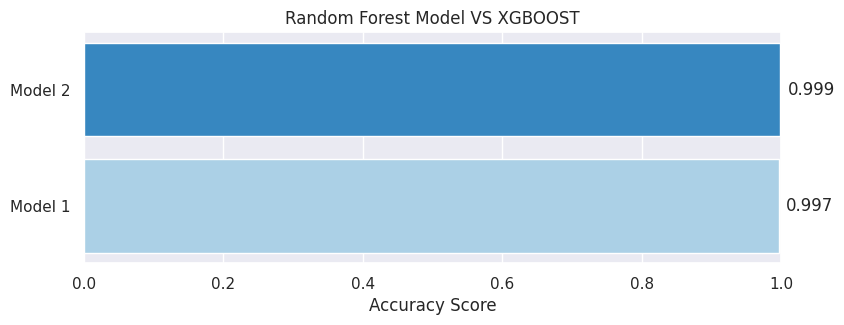

In [163]:
from sklearn.metrics import accuracy_score

# Decode xgb predictions to string labels (if needed)
y_pred_xgb_labels = le.inverse_transform(y_pred_xgb)

acc1 = accuracy_score(y_test, y_pred_rf1)          # y_test vs rf1 predictions (both strings)
acc2 = accuracy_score(y_test, y_pred_xgb_labels)  # y_test vs decoded xgb predictions (both strings)

labels = ['Model 1', 'Model 2']
scores = [acc1, acc2]

palette = sns.color_palette('Blues', n_colors=2)

fig, ax = plt.subplots(figsize=(9, 3))
ax.barh(labels, scores, color=palette)
ax.set_xlim([0, 1])
ax.set_xlabel('Accuracy Score')
ax.set_title('Random Forest Model VS XGBOOST')

for i, v in enumerate(scores):
    ax.text(v + 0.01, i, str(round(v, 3)), ha='left', va='center')

plt.show()


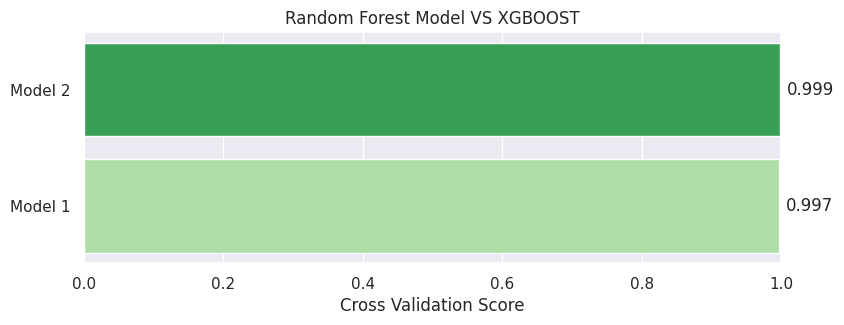

In [164]:
palette = sns.color_palette('Greens', n_colors = 2)

labels = ['Model 1', 'Model 2']
scores = [cv_rf1.mean(), cv_xgb.mean()]

fig, ax = plt.subplots(figsize = (9, 3))
ax.barh(labels, scores, color = palette)
ax.set_xlim([0, 1])
ax.set_xlabel('Cross Validation Score')
ax.set_title('Random Forest Model VS XGBOOST')

for i, v in enumerate(scores):
    ax.text(v + 0.01, i, str(round(v, 3)), ha = 'left', va = 'center')

plt.show()

In [166]:
import joblib

# --- Saving models and preprocessors ---
joblib.dump(rf1, 'random_forest_model.joblib')
joblib.dump(xgb, 'xgboost_model.joblib')
joblib.dump(scaler, 'scaler.joblib')
joblib.dump(ipca, 'pca.joblib')
joblib.dump(le, 'label_encoder.joblib')  # Save LabelEncoder too

# --- Later, loading them back ---
rf1_loaded = joblib.load('random_forest_model.joblib')
xgb_loaded = joblib.load('xgboost_model.joblib')
scaler_loaded = joblib.load('scaler.joblib')
pca_loaded = joblib.load('pca.joblib')
le_loaded = joblib.load('label_encoder.joblib')  # Load LabelEncoder
